<a href="https://colab.research.google.com/github/iamkaracho/elvtr/blob/main/pklein_transcript.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install openai-whisper yt_dlp

  Using cached openai-whisper-20231117.tar.gz (798 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached yt_dlp-2024.4.9-py3-none-any.whl (3.1 MB)
  Using cached tiktoken-0.6.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (1.8 MB)
  Using cached Brotli-1.1.0-cp310-cp310-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl (3.0 MB)
  Using cached mutagen-1.47.0-py3-none-any.whl (194 kB)
  Using cached pycryptodomex-3.20.0-cp35-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.1 MB)
  Using cached websockets-12.0-cp310-cp310-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (130 kB)
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-

In [ ]:
import whisper
from whisper.utils import get_writer

In [ ]:
import os
import shutil
import time
from pathlib import Path
import yt_dlp
from IPython.display import Audio, display

In [ ]:
def download_audio(link):
  with yt_dlp.YoutubeDL({'extract_audio': True, 'format': 'bestaudio', 'outtmpl': '%(title)s.mp3'}) as video:
    info_dict = video.extract_info(link, download = True)
    video_title = info_dict['title']
    video.download(link)
    return f'{video_title}.mp3'

file_name = download_audio('https://www.youtube.com/watch?v=EwJFSZE2kws')

[youtube] Extracting URL: https://www.youtube.com/watch?v=EwJFSZE2kws
[youtube] EwJFSZE2kws: Downloading webpage
[youtube] EwJFSZE2kws: Downloading ios player API JSON
[youtube] EwJFSZE2kws: Downloading android player API JSON


[youtube] EwJFSZE2kws: Downloading player 652ba3a2
[youtube] EwJFSZE2kws: Downloading m3u8 information
[info] EwJFSZE2kws: Downloading 1 format(s): 251
[download] Destination: Why Mark Zuckerberg turned down $1B for Facebook.mp3
[download] 100% of    3.72MiB in 00:00:00 at 41.59MiB/s  
[youtube] Extracting URL: https://www.youtube.com/watch?v=EwJFSZE2kws
[youtube] EwJFSZE2kws: Downloading webpage
[youtube] EwJFSZE2kws: Downloading ios player API JSON
[youtube] EwJFSZE2kws: Downloading android player API JSON


[youtube] EwJFSZE2kws: Downloading m3u8 information
[info] EwJFSZE2kws: Downloading 1 format(s): 251
[download] Why Mark Zuckerberg turned down $1B for Facebook.mp3 has already been downloaded
[download] 100% of    3.72MiB


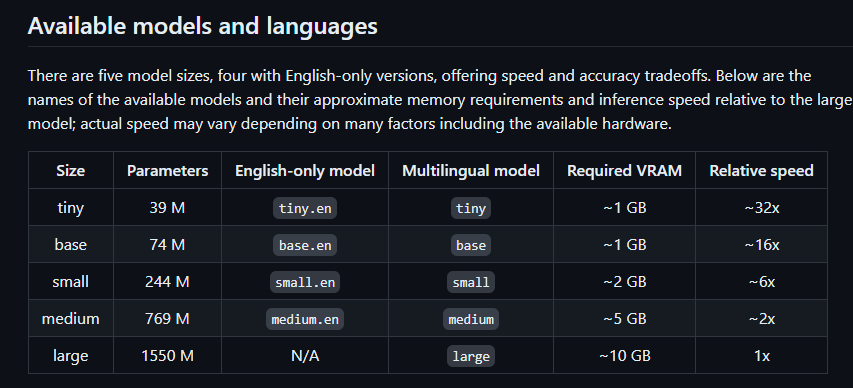

##  base model

In [ ]:
# Laden des Modell
model = whisper.load_model("base", verbose=True)

# Transkription

result = model.transcribe(file_name)

print(result)

100%|███████████████████████████████████████| 139M/139M [00:05<00:00, 27.5MiB/s]
/usr/local/lib/python3.10/dist-packages/whisper/transcribe.py:115: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")


{'text': " So you didn't suffer one billion with presumably there's some of them out you would have sold for right. Did you write down in your head like I think the actual valuation of Facebook at the time is this and they're not actually getting the valuation right. They're already five trillion dollars of course you would have sold so what like how did you think about that choice. Yeah I don't know I mean look I think some of these things are just personal. I don't know at the time that I was sophisticated enough to do that analysis. But I had all these people around me who were making all these arguments for how like a billion dollars was you know it's like here's the revenue that we need to make and here's how big we need to be and like it's clearly so many years in the future like and it was it was very far ahead of where we were at the time. And I don't know I didn't really have the financial sophistication to really even engage with that kind of debate. I just I think I sort of 

## large model [ggf. auf gpu laufzeit umstellen, dann aber komplettes notebook nochmal ausführen]

In [ ]:
# Laden des Modell
model = whisper.load_model("large")

# Transkription

audio = file_name

result2 = model.transcribe(audio)

print(result2)

100%|█████████████████████████████████████| 2.88G/2.88G [00:41<00:00, 73.8MiB/s]
/usr/local/lib/python3.10/dist-packages/whisper/transcribe.py:115: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")


{'text': " So you didn't sell for $1 billion, but presumably there's some amount you would have sold for, right? Did you write down in your head, like, I think the actual valuation of Facebook at the time is this, and they're not actually getting the valuation right? They're already $5 trillion. Of course you would have sold. So how did you think about that choice? Yeah, I don't know. I mean, look, I think some of these things are just personal. I don't know at the time that I was sophisticated enough to do that analysis, but I had all these people around me who were making all these arguments for how, like, a billion dollars was, you know, it's like, here's the revenue that we need to make, and here's how big we need to be. And like, it's clearly so many years in the future. Like, I mean, it was very far ahead of where we were at the time. And I don't know, I didn't really have the financial sophistication to really even engage with that kind of debate. I just, I think I sort of deep 

In [ ]:
import os

# Erstellen eines Verzeichnisses im content-Verzeichnis von Colab
output_dir_b = '/content/transcriptions/base/'
output_dir_l = '/content/transcriptions/large/'
os.makedirs(output_dir_b, exist_ok=True)
os.makedirs(output_dir_l, exist_ok=True)

# Speichern als SRT-Datei
srt_writer = get_writer("srt", output_dir_b)
srt_writer(result, audio)

srt_writer = get_writer("srt", output_dir_l)
srt_writer(result2, audio)

# Speichern als TXT-Datei
txt_writer = get_writer("txt", output_dir_b)
txt_writer(result, audio)

txt_writer = get_writer("txt", output_dir_l)
txt_writer(result2, audio)

# Speichern als VTT-Datei
vtt_writer = get_writer("vtt", output_dir_b)
vtt_writer(result, audio)

vtt_writer = get_writer("vtt", output_dir_l)
vtt_writer(result2, audio)


## TTS

In [ ]:
!pip install openai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.6/311.6 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 5.7 MB/s eta 0:00:00


In [ ]:
# OPENAI KEY lesen
import os
try:
    from google.colab import userdata
    OPENAI_KEY = userdata.get('OPENAI_KEY')
except:
    OPENAI_KEY = os.getenv('OPENAI_KEY')
os.environ['OPENAI_API_KEY'] = OPENAI_KEY

In [ ]:
from openai import OpenAI
client = OpenAI()

In [ ]:
text_to_speech = result.get('text')
text_to_speech2 = result2.get('text')


 So you didn't suffer one billion with presumably there's some of them out you would have sold for right. Did you write down in your head like I think the actual valuation of Facebook at the time is this and they're not actually getting the valuation right. They're already five trillion dollars of course you would have sold so what like how did you think about that choice. Yeah I don't know I mean look I think some of these things are just personal. I don't know at the time that I was sophisticated enough to do that analysis. But I had all these people around me who were making all these arguments for how like a billion dollars was you know it's like here's the revenue that we need to make and here's how big we need to be and like it's clearly so many years in the future like and it was it was very far ahead of where we were at the time. And I don't know I didn't really have the financial sophistication to really even engage with that kind of debate. I just I think I sort of deep down 

Base-Output in TTS

In [ ]:
speech_file_path = Path('text-to-speech.mp3')
response = client.audio.speech.create(
  model="tts-1",
  voice="alloy",
  input=text_to_speech
)

response.stream_to_file(speech_file_path)

<ipython-input-21-9b17b91c378f>:8: DeprecationWarning: Due to a bug, this method doesn't actually stream the response content, `.with_streaming_response.method()` should be used instead
  response.stream_to_file(speech_file_path)


In [ ]:
display(Audio(speech_file_path, autoplay=True))

Large-Output in TTS

In [ ]:
speech_file_path2 = Path('text-to-speech2.mp3')
response = client.audio.speech.create(
  model="tts-1",
  voice="alloy",
  input=text_to_speech2
)

response.stream_to_file(speech_file_path2)

<ipython-input-32-8689ee02508a>:8: DeprecationWarning: Due to a bug, this method doesn't actually stream the response content, `.with_streaming_response.method()` should be used instead
  response.stream_to_file(speech_file_path2)


In [ ]:
display(Audio(speech_file_path2, autoplay=True))